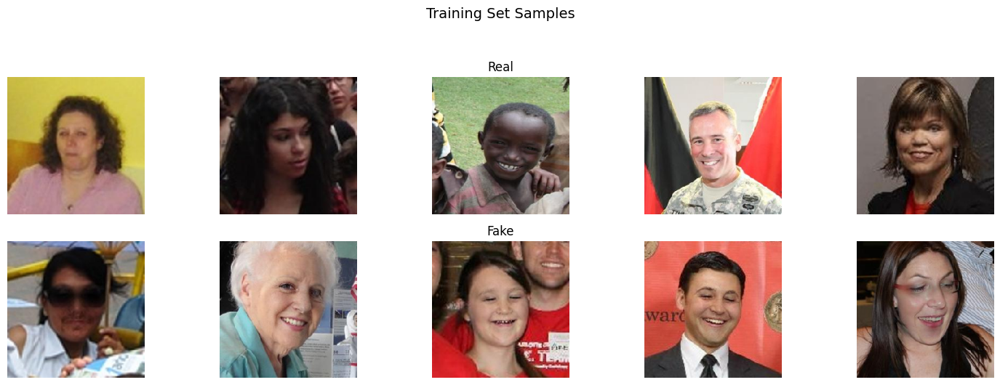

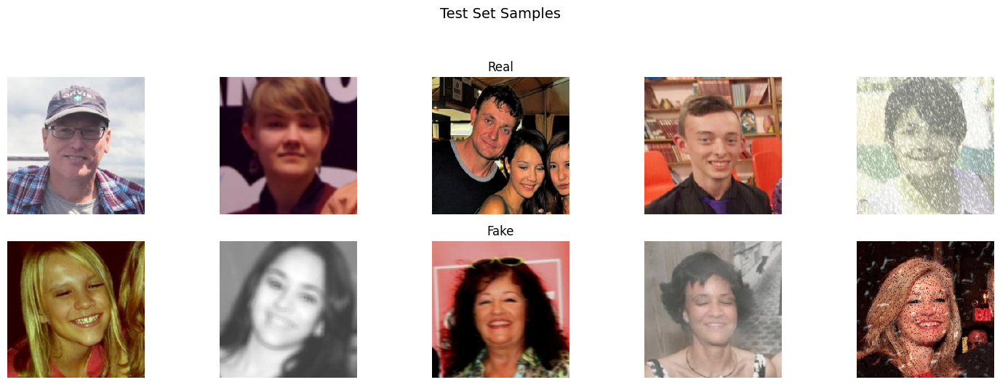

In [8]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg19 import preprocess_input

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Dataset paths
train_dir = '/kaggle/input/deepfake-and-real-images/Dataset/Train'
test_dir = '/kaggle/input/deepfake-and-real-images/Dataset/Test'

# 1. Enhanced sample visualization
def visualize_samples(directory, num_samples=5, title="Sample Images"):
    plt.figure(figsize=(15, 5))
    
    real_dir = os.path.join(directory, 'Real')
    fake_dir = os.path.join(directory, 'Fake')
    
    real_images = [os.path.join(real_dir, f) for f in os.listdir(real_dir)[:num_samples]]
    fake_images = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir)[:num_samples]]
    
    # Display real images
    for i, img_path in enumerate(real_images):
        img = load_img(img_path, target_size=(224, 224))
        plt.subplot(2, num_samples, i+1)
        plt.imshow(img)
        plt.title("Real" if i == 2 else "", fontsize=12)
        plt.axis('off')
    
    # Display fake images
    for i, img_path in enumerate(fake_images):
        img = load_img(img_path, target_size=(224, 224))
        plt.subplot(2, num_samples, num_samples+i+1)
        plt.imshow(img)
        plt.title("Fake" if i == 2 else "", fontsize=12)
        plt.axis('off')
    
    plt.suptitle(title, fontsize=14, y=1.05)
    plt.tight_layout()
    plt.show()

# Show samples
visualize_samples(train_dir, title="Training Set Samples")
visualize_samples(test_dir, title="Test Set Samples")

# 2. Attack implementations
def preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    return preprocess_input(img_array)  # VGG19 preprocessing

def deprocess_image(x):
    x = (x + 1) * 127.5  # Convert from [-1,1] to [0,255]
    return np.clip(x, 0, 255).astype('uint8')

def fgsm_attack(model, x, eps=0.01):
    x_tensor = tf.convert_to_tensor(x[np.newaxis, ...])
    with tf.GradientTape() as tape:
        tape.watch(x_tensor)
        prediction = model(x_tensor)
        loss = tf.keras.losses.binary_crossentropy([[1]], prediction)  # Target to fake
    
    gradient = tape.gradient(loss, x_tensor)
    perturbation = eps * tf.sign(gradient)
    x_adv = x_tensor + perturbation
    return tf.clip_by_value(x_adv, -1, 1)[0].numpy()

def pgd_attack(model, x, eps=0.1, alpha=0.01, iterations=10):
    x_adv = np.copy(x)
    for _ in range(iterations):
        x_adv = fgsm_attack(model, x_adv, alpha)
        perturbation = np.clip(x_adv - x, -eps, eps)
        x_adv = x + perturbation
        x_adv = np.clip(x_adv, -1, 1)
    return x_adv

def one_pixel_attack(x, change_amount=0.5):
    adv_img = np.copy(x)
    h, w = adv_img.shape[:2]
    x_pos, y_pos = np.random.randint(0, w), np.random.randint(0, h)
    adv_img[y_pos, x_pos, :] = np.clip(adv_img[y_pos, x_pos, :] + change_amount, -1, 1)
    return adv_img

# 3. Visualization functions
def visualize_attack(x_original, attack_fn, params, attack_name):
    plt.figure(figsize=(20, 6))
    
    # Original image
    plt.subplot(2, len(params)+1, 1)
    plt.imshow(deprocess_image(x_original))
    plt.title("Original Image", fontsize=10)
    plt.axis('off')
    
    # Adversarial images
    for i, param in enumerate(params):
        plt.subplot(2, len(params)+1, i+2)
        x_adv = attack_fn(model, x_original, param) if attack_name != 'One-Pixel' else attack_fn(x_original, param)
        plt.imshow(deprocess_image(x_adv))
        plt.title(f"{attack_name}\nParam: {param}", fontsize=8)
        plt.axis('off')
    
    # Perturbations
    for i, param in enumerate(params):
        plt.subplot(2, len(params)+1, len(params)+i+3)
        x_adv = attack_fn(model, x_original, param) if attack_name != 'One-Pixel' else attack_fn(x_original, param)
        perturbation = x_adv - x_original
        plt.imshow((perturbation - perturbation.min()) / (perturbation.max() - perturbation.min()))
        plt.title(f"Perturbation\nScale: {param}", fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# 4. Load sample image and model
sample_img_path = os.path.join(train_dir, 'Real', os.listdir(os.path.join(train_dir, 'Real'))[0])
x_original = preprocess_image(sample_img_path)

# Create simple model
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = Flatten()(base_model.output)
x = Dense(1, activation='sigmoid')(x)
model = Model(base_model.input, x)




FGSM Attack Visualization:


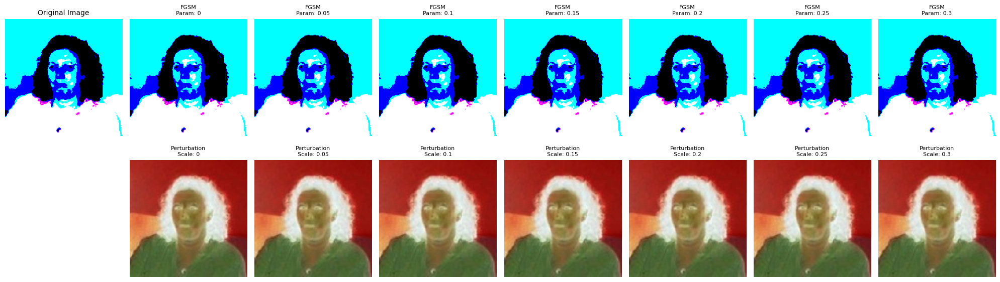


PGD Attack Visualization:


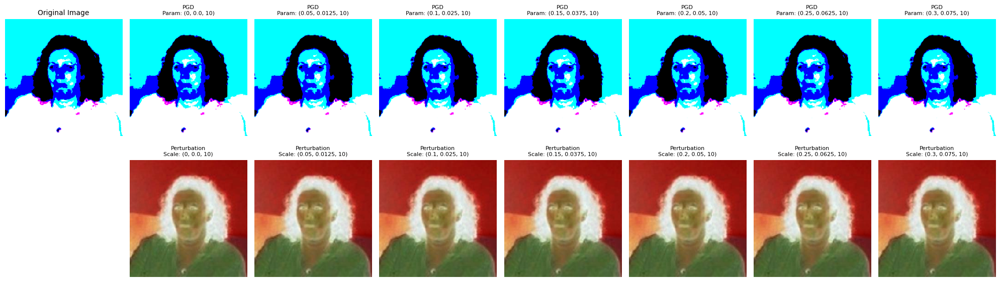


One-Pixel Attack Visualization:


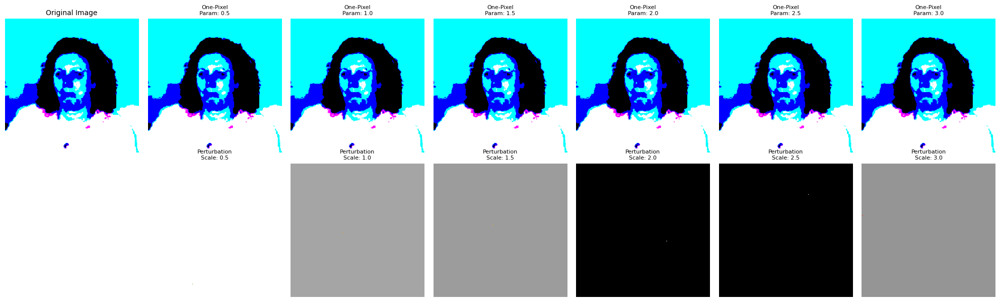

In [9]:
# 5. Generate visualizations
epsilons = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
pgd_params = [(eps, eps/4, 10) for eps in epsilons]
pixel_params = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]

print("\nFGSM Attack Visualization:")
visualize_attack(x_original, fgsm_attack, epsilons, "FGSM")

print("\nPGD Attack Visualization:")
visualize_attack(x_original, lambda m,x,e: pgd_attack(m,x,e[0],e[1],e[2]), pgd_params, "PGD")

print("\nOne-Pixel Attack Visualization:")
visualize_attack(x_original, one_pixel_attack, pixel_params, "One-Pixel")



Attack Impact Analysis:


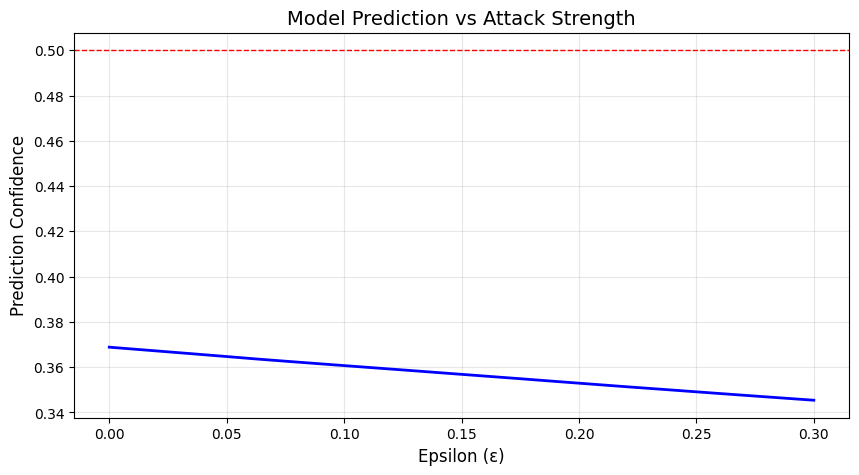


Perturbation Distribution Analysis:


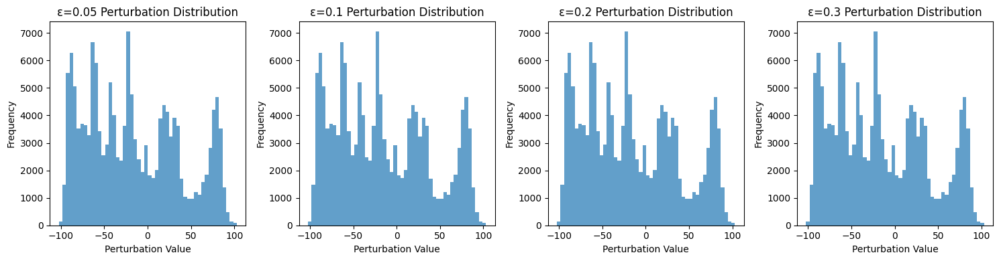

In [11]:

# 6. Additional analysis plots
def plot_attack_impact():
    eps_range = np.linspace(0, 0.3, 20)
    preds = []
    
    for eps in eps_range:
        x_adv = fgsm_attack(model, x_original, eps)
        pred = model.predict(x_adv[np.newaxis,...], verbose=0)[0][0]
        preds.append(pred)
    
    plt.figure(figsize=(10,5))
    plt.plot(eps_range, preds, 'b-', linewidth=2)
    plt.axhline(0.5, color='r', linestyle='--', linewidth=1)
    plt.xlabel('Epsilon (ε)', fontsize=12)
    plt.ylabel('Prediction Confidence', fontsize=12)
    plt.title('Model Prediction vs Attack Strength', fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.show()

print("\nAttack Impact Analysis:")
plot_attack_impact()

def plot_perturbation_magnitude():
    epsilons = [0.05, 0.1, 0.2, 0.3]
    plt.figure(figsize=(15, 4))
    
    for i, eps in enumerate(epsilons):
        x_adv = fgsm_attack(model, x_original, eps)
        perturbation = x_adv - x_original
        
        plt.subplot(1, len(epsilons), i+1)
        plt.hist(perturbation.flatten(), bins=50, alpha=0.7)
        plt.title(f"ε={eps} Perturbation Distribution")
        plt.xlabel('Perturbation Value')
        plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

print("\nPerturbation Distribution Analysis:")
plot_perturbation_magnitude()

aqwsedr

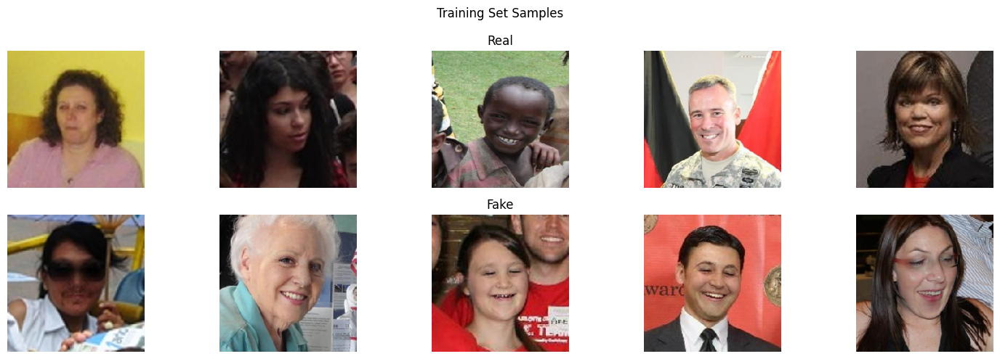

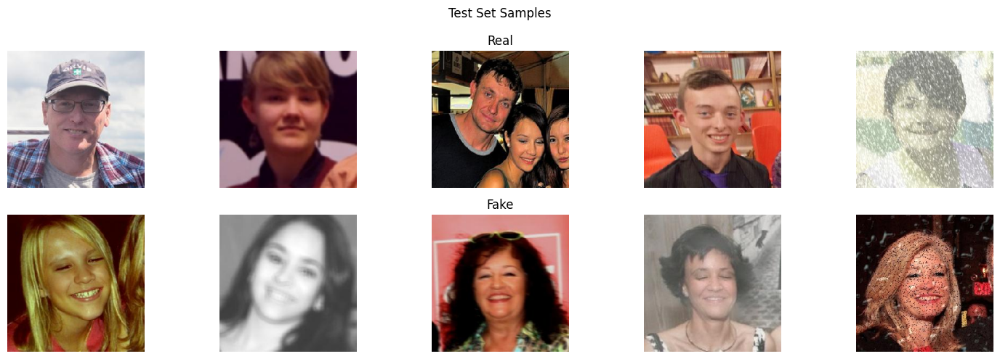


FGSM Attack Visualization:


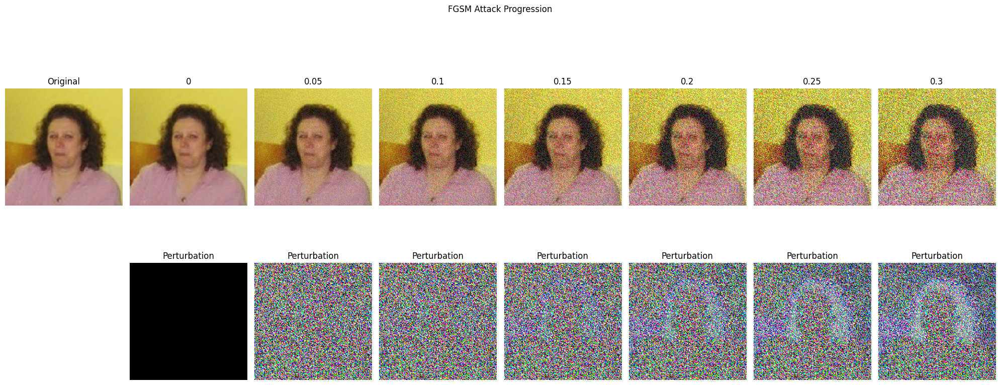


PGD Attack Visualization:


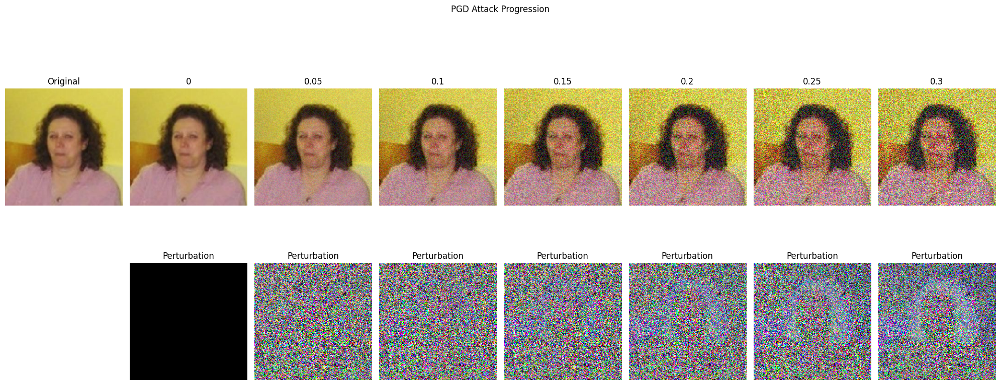


One-Pixel Attack Visualization:


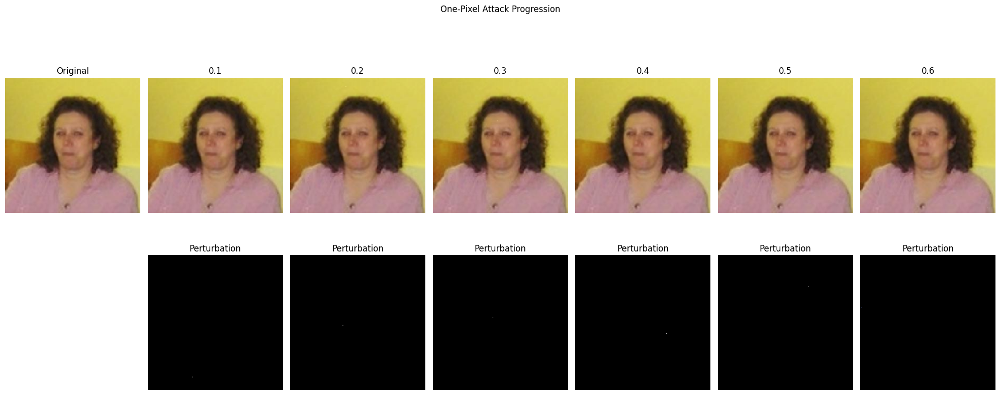


Attack Impact Analysis:


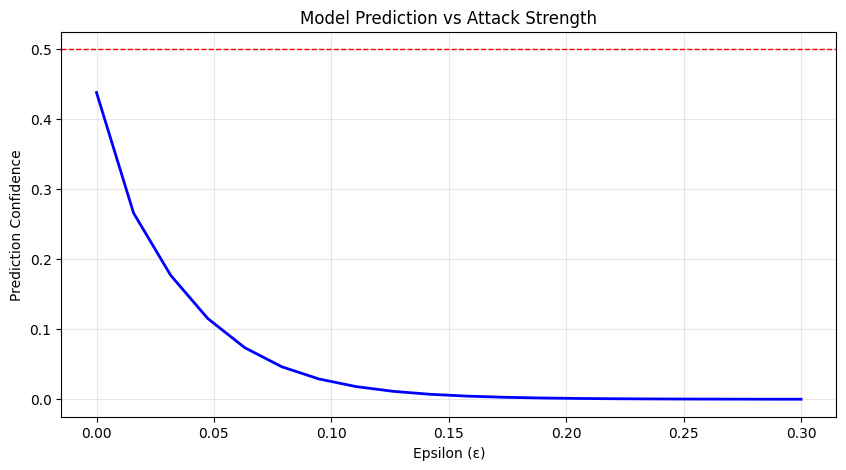

In [10]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Dataset paths
train_dir = '/kaggle/input/deepfake-and-real-images/Dataset/Train'
test_dir = '/kaggle/input/deepfake-and-real-images/Dataset/Test'

# 1. Show REAL vs FAKE samples (5 each)
def show_samples(directory, title="Sample Images"):
    plt.figure(figsize=(15, 5))
    
    real_dir = os.path.join(directory, 'Real')
    fake_dir = os.path.join(directory, 'Fake')
    
    # Get first 5 real and fake images
    real_images = [os.path.join(real_dir, f) for f in os.listdir(real_dir)[:5]]
    fake_images = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir)[:5]]
    
    # Display real images
    for i, img_path in enumerate(real_images):
        img = load_img(img_path, target_size=(224, 224))
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.title("Real" if i == 2 else "")
        plt.axis('off')
    
    # Display fake images
    for i, img_path in enumerate(fake_images):
        img = load_img(img_path, target_size=(224, 224))
        plt.subplot(2, 5, 6+i)
        plt.imshow(img)
        plt.title("Fake" if i == 2 else "")
        plt.axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Show samples
show_samples(train_dir, "Training Set Samples")
show_samples(test_dir, "Test Set Samples")

# 2. Load a sample image for attacks
sample_img_path = os.path.join(train_dir, 'Real', os.listdir(os.path.join(train_dir, 'Real'))[0])
original_img = img_to_array(load_img(sample_img_path, target_size=(224, 224))) / 255.0  # Normalize to [0,1]

# 3. Attack implementations (works with raw images 0-1 range)
def fgsm_attack_raw(model, x, eps=0.01):
    x_tensor = tf.convert_to_tensor(x[np.newaxis, ...])
    with tf.GradientTape() as tape:
        tape.watch(x_tensor)
        prediction = model(x_tensor)
        loss = tf.keras.losses.binary_crossentropy([[1]], prediction)  # Target to fake
    
    gradient = tape.gradient(loss, x_tensor)
    perturbation = eps * tf.sign(gradient)
    x_adv = x_tensor + perturbation
    return tf.clip_by_value(x_adv, 0, 1)[0].numpy()  # Keep in [0,1] range

def pgd_attack_raw(model, x, eps=0.1, alpha=0.01, iterations=10):
    x_adv = np.copy(x)
    for _ in range(iterations):
        x_adv = fgsm_attack_raw(model, x_adv, alpha)
        perturbation = np.clip(x_adv - x, -eps, eps)
        x_adv = x + perturbation
        x_adv = np.clip(x_adv, 0, 1)
    return x_adv

def one_pixel_attack_raw(x, change_amount=0.3):
    adv_img = np.copy(x)
    h, w = adv_img.shape[:2]
    x_pos, y_pos = np.random.randint(0, w), np.random.randint(0, h)
    adv_img[y_pos, x_pos, :] = np.clip(adv_img[y_pos, x_pos, :] + change_amount, 0, 1)
    return adv_img

# 4. Create a simple model (replace with your actual model)
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy')

# 5. Visualization function for attacks
def visualize_attacks_raw(original_img, attack_fn, params, attack_name):
    plt.figure(figsize=(20, 8))
    rows = 2  # Original + adversarial rows
    cols = len(params) + 1  # +1 for original image
    
    # Original image
    plt.subplot(rows, cols, 1)
    plt.imshow(original_img)
    plt.title("Original")
    plt.axis('off')
    
    # Adversarial images
    for i, param in enumerate(params, start=1):
        adv_img = attack_fn(model, original_img, param) if attack_name != 'One-Pixel' else attack_fn(original_img, param)
        plt.subplot(rows, cols, i+1)
        plt.imshow(adv_img)
        plt.title(f"{param}")
        plt.axis('off')
    
    # Perturbations (second row)
    for i, param in enumerate(params, start=1):
        adv_img = attack_fn(model, original_img, param) if attack_name != 'One-Pixel' else attack_fn(original_img, param)
        perturbation = adv_img - original_img
        plt.subplot(rows, cols, cols+i+1)
        plt.imshow((perturbation - perturbation.min()) / (perturbation.max() - perturbation.min()))
        plt.title(f"Perturbation")
        plt.axis('off')
    
    plt.suptitle(f"{attack_name} Attack Progression", y=1.05)
    plt.tight_layout()
    plt.show()

# 6. Generate visualizations
epsilons = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
pixel_params = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]

print("\nFGSM Attack Visualization:")
visualize_attacks_raw(original_img, fgsm_attack_raw, epsilons, "FGSM")

print("\nPGD Attack Visualization:")
visualize_attacks_raw(original_img, lambda m,x,e: pgd_attack_raw(m,x,e,e/4,10), epsilons, "PGD")

print("\nOne-Pixel Attack Visualization:")
visualize_attacks_raw(original_img, one_pixel_attack_raw, pixel_params, "One-Pixel")



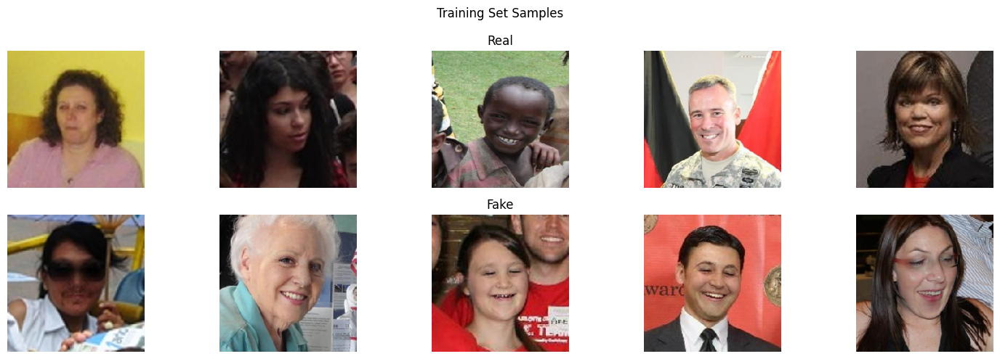

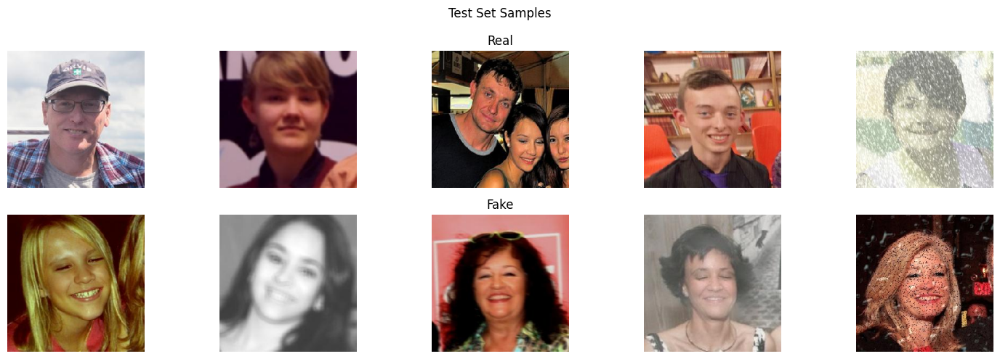


FGSM Attack Visualization:


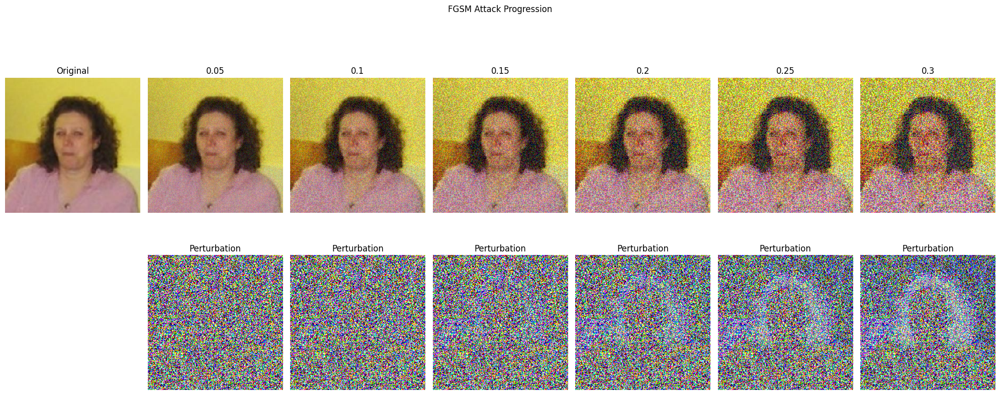


PGD Attack Visualization:


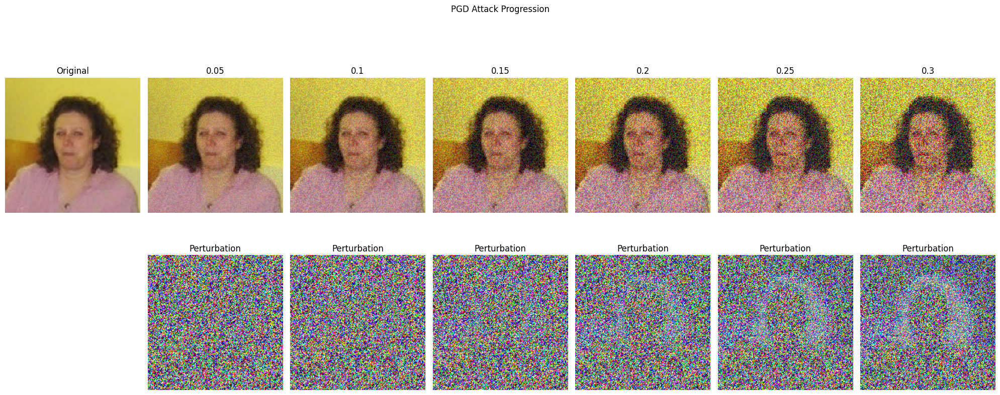


One-Pixel Attack Visualization:


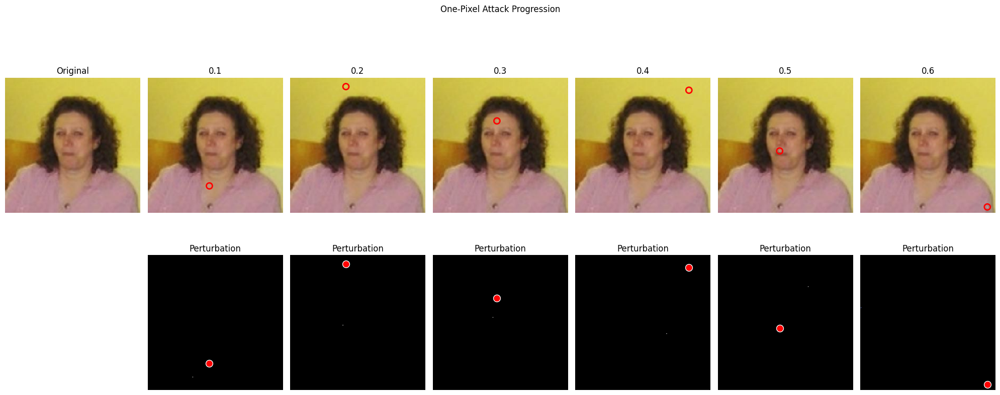


Detailed One-Pixel Changes:


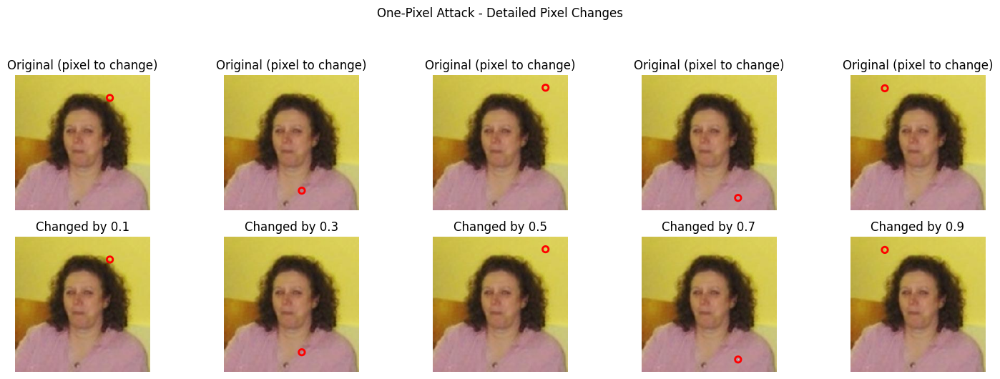


Attack Magnitude Comparison:


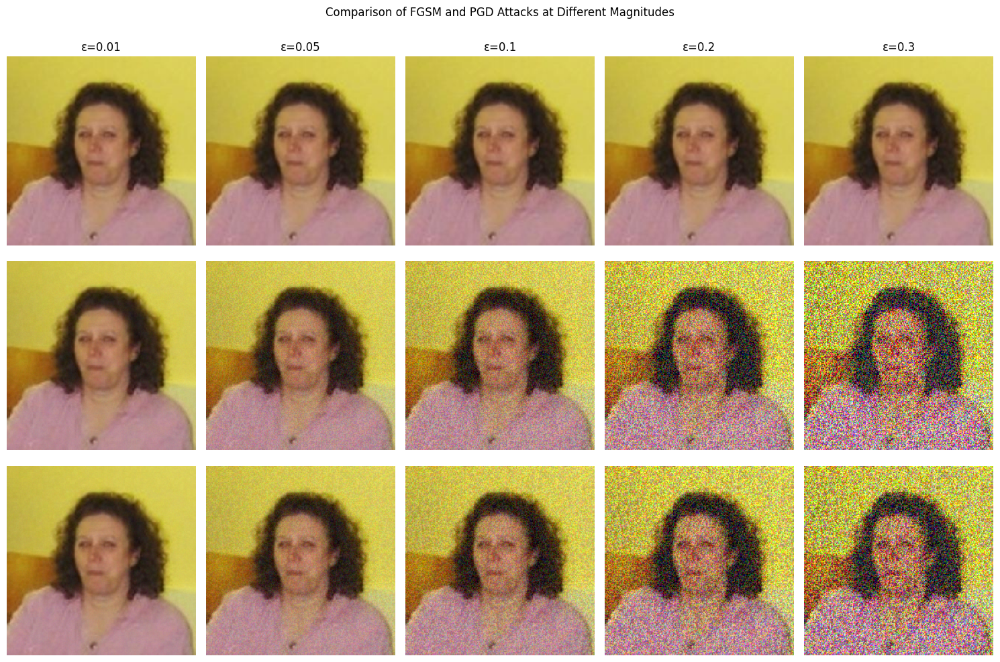

In [12]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Dataset paths
train_dir = '/kaggle/input/deepfake-and-real-images/Dataset/Train'
test_dir = '/kaggle/input/deepfake-and-real-images/Dataset/Test'

# 1. Show REAL vs FAKE samples (5 each)
def show_samples(directory, title="Sample Images"):
    plt.figure(figsize=(15, 5))
    
    real_dir = os.path.join(directory, 'Real')
    fake_dir = os.path.join(directory, 'Fake')
    
    # Get first 5 real and fake images
    real_images = [os.path.join(real_dir, f) for f in os.listdir(real_dir)[:5]]
    fake_images = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir)[:5]]
    
    # Display real images
    for i, img_path in enumerate(real_images):
        img = load_img(img_path, target_size=(224, 224))
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.title("Real" if i == 2 else "")
        plt.axis('off')
    
    # Display fake images
    for i, img_path in enumerate(fake_images):
        img = load_img(img_path, target_size=(224, 224))
        plt.subplot(2, 5, 6+i)
        plt.imshow(img)
        plt.title("Fake" if i == 2 else "")
        plt.axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Show samples
show_samples(train_dir, "Training Set Samples")
show_samples(test_dir, "Test Set Samples")

# 2. Load a sample image for attacks
sample_img_path = os.path.join(train_dir, 'Real', os.listdir(os.path.join(train_dir, 'Real'))[0])
original_img = img_to_array(load_img(sample_img_path, target_size=(224, 224))) / 255.0  # Normalize to [0,1]

# 3. Attack implementations (works with raw images 0-1 range)
def fgsm_attack_raw(model, x, eps=0.01):
    x_tensor = tf.convert_to_tensor(x[np.newaxis, ...])
    with tf.GradientTape() as tape:
        tape.watch(x_tensor)
        prediction = model(x_tensor)
        loss = tf.keras.losses.binary_crossentropy([[1]], prediction)  # Target to fake
    
    gradient = tape.gradient(loss, x_tensor)
    perturbation = eps * tf.sign(gradient)
    x_adv = x_tensor + perturbation
    return tf.clip_by_value(x_adv, 0, 1)[0].numpy()  # Keep in [0,1] range

def pgd_attack_raw(model, x, eps=0.1, alpha=0.01, iterations=10):
    x_adv = np.copy(x)
    for _ in range(iterations):
        x_adv = fgsm_attack_raw(model, x_adv, alpha)
        perturbation = np.clip(x_adv - x, -eps, eps)
        x_adv = x + perturbation
        x_adv = np.clip(x_adv, 0, 1)
    return x_adv

def one_pixel_attack_raw(x, change_amount=0.3):
    adv_img = np.copy(x)
    h, w = adv_img.shape[:2]
    x_pos, y_pos = np.random.randint(0, w), np.random.randint(0, h)
    # Store the position of the modified pixel
    modified_pos = (x_pos, y_pos)
    # Change all color channels
    adv_img[y_pos, x_pos, :] = np.clip(adv_img[y_pos, x_pos, :] + change_amount, 0, 1)
    return adv_img, modified_pos

# 4. Create a simple model (replace with your actual model)
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy')

# 5. Visualization function for attacks
def visualize_attacks_raw(original_img, attack_fn, params, attack_name):
    plt.figure(figsize=(20, 8))
    rows = 2  # Original + adversarial rows
    cols = len(params) + 1  # +1 for original image
    
    # Original image
    plt.subplot(rows, cols, 1)
    plt.imshow(original_img)
    plt.title("Original")
    plt.axis('off')
    
    # Adversarial images
    modified_positions = []
    for i, param in enumerate(params, start=1):
        if attack_name == 'One-Pixel':
            adv_img, pos = attack_fn(original_img, param)
            modified_positions.append(pos)
        else:
            adv_img = attack_fn(model, original_img, param)
            modified_positions.append(None)
            
        plt.subplot(rows, cols, i+1)
        plt.imshow(adv_img)
        
        # Circle the modified pixel for one-pixel attack
        if attack_name == 'One-Pixel':
            circle = plt.Circle((pos[0], pos[1]), 5, color='red', fill=False, linewidth=2)
            plt.gca().add_patch(circle)
        
        plt.title(f"{param}")
        plt.axis('off')
    
    # Perturbations (second row)
    for i, param in enumerate(params, start=1):
        if attack_name == 'One-Pixel':
            adv_img, _ = attack_fn(original_img, param)
        else:
            adv_img = attack_fn(model, original_img, param)
            
        perturbation = adv_img - original_img
        plt.subplot(rows, cols, cols+i+1)
        plt.imshow((perturbation - perturbation.min()) / (perturbation.max() - perturbation.min()))
        
        # Highlight the pixel for one-pixel attack
        if attack_name == 'One-Pixel':
            pos = modified_positions[i-1]
            plt.scatter([pos[0]], [pos[1]], c='red', s=100, marker='o', edgecolors='white')
        
        plt.title(f"Perturbation")
        plt.axis('off')
    
    plt.suptitle(f"{attack_name} Attack Progression", y=1.05)
    plt.tight_layout()
    plt.show()

# 6. Generate visualizations
epsilons = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
pixel_params = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]

print("\nFGSM Attack Visualization:")
visualize_attacks_raw(original_img, fgsm_attack_raw, epsilons, "FGSM")

print("\nPGD Attack Visualization:")
visualize_attacks_raw(original_img, lambda m,x,e: pgd_attack_raw(m,x,e,e/4,10), epsilons, "PGD")

print("\nOne-Pixel Attack Visualization:")
visualize_attacks_raw(original_img, one_pixel_attack_raw, pixel_params, "One-Pixel")

# 7. Additional visualizations
def visualize_pixel_changes(original_img, change_amounts):
    plt.figure(figsize=(15, 5))
    n = len(change_amounts)
    
    for i, amount in enumerate(change_amounts):
        adv_img, pos = one_pixel_attack_raw(original_img, amount)
        
        # Show original with marked pixel
        plt.subplot(2, n, i+1)
        plt.imshow(original_img)
        circle = plt.Circle((pos[0], pos[1]), 5, color='red', fill=False, linewidth=2)
        plt.gca().add_patch(circle)
        plt.title(f"Original (pixel to change)")
        plt.axis('off')
        
        # Show modified image
        plt.subplot(2, n, n+i+1)
        plt.imshow(adv_img)
        circle = plt.Circle((pos[0], pos[1]), 5, color='red', fill=False, linewidth=2)
        plt.gca().add_patch(circle)
        plt.title(f"Changed by {amount:.1f}")
        plt.axis('off')
    
    plt.suptitle("One-Pixel Attack - Detailed Pixel Changes", y=1.05)
    plt.tight_layout()
    plt.show()

def visualize_attack_magnitudes(original_img):
    epsilons = [0.01, 0.05, 0.1, 0.2, 0.3]
    plt.figure(figsize=(15, 10))
    
    for i, eps in enumerate(epsilons):
        # FGSM
        fgsm_img = fgsm_attack_raw(model, original_img, eps)
        # PGD
        pgd_img = pgd_attack_raw(model, original_img, eps, eps/4, 10)
        
        # Original
        plt.subplot(3, len(epsilons), i+1)
        if i == 0:
            plt.ylabel("Original", size=12)
        plt.imshow(original_img)
        plt.title(f"ε={eps}")
        plt.axis('off')
        
        # FGSM
        plt.subplot(3, len(epsilons), len(epsilons)+i+1)
        if i == 0:
            plt.ylabel("FGSM", size=12)
        plt.imshow(fgsm_img)
        plt.axis('off')
        
        # PGD
        plt.subplot(3, len(epsilons), 2*len(epsilons)+i+1)
        if i == 0:
            plt.ylabel("PGD", size=12)
        plt.imshow(pgd_img)
        plt.axis('off')
    
    plt.suptitle("Comparison of FGSM and PGD Attacks at Different Magnitudes", y=1.0)
    plt.tight_layout()
    plt.show()

# Run additional visualizations
print("\nDetailed One-Pixel Changes:")
visualize_pixel_changes(original_img, [0.1, 0.3, 0.5, 0.7, 0.9])

print("\nAttack Magnitude Comparison:")
visualize_attack_magnitudes(original_img)